In [1]:
from scipy.io import arff
import pandas as pd
from scipy.misc import electrocardiogram
import matplotlib.pyplot as plt
import numpy as np


In [2]:
data = arff.loadarff('ECG5000_TRAIN.arff')
df = pd.DataFrame(data[0])

#for column in df.columns:
#    print(column)
    
columns=[x for x in df.columns if x!="target"]    
print(columns)


['att1', 'att2', 'att3', 'att4', 'att5', 'att6', 'att7', 'att8', 'att9', 'att10', 'att11', 'att12', 'att13', 'att14', 'att15', 'att16', 'att17', 'att18', 'att19', 'att20', 'att21', 'att22', 'att23', 'att24', 'att25', 'att26', 'att27', 'att28', 'att29', 'att30', 'att31', 'att32', 'att33', 'att34', 'att35', 'att36', 'att37', 'att38', 'att39', 'att40', 'att41', 'att42', 'att43', 'att44', 'att45', 'att46', 'att47', 'att48', 'att49', 'att50', 'att51', 'att52', 'att53', 'att54', 'att55', 'att56', 'att57', 'att58', 'att59', 'att60', 'att61', 'att62', 'att63', 'att64', 'att65', 'att66', 'att67', 'att68', 'att69', 'att70', 'att71', 'att72', 'att73', 'att74', 'att75', 'att76', 'att77', 'att78', 'att79', 'att80', 'att81', 'att82', 'att83', 'att84', 'att85', 'att86', 'att87', 'att88', 'att89', 'att90', 'att91', 'att92', 'att93', 'att94', 'att95', 'att96', 'att97', 'att98', 'att99', 'att100', 'att101', 'att102', 'att103', 'att104', 'att105', 'att106', 'att107', 'att108', 'att109', 'att110', 'att111

[b'1' b'2' b'3' b'4' b'5']


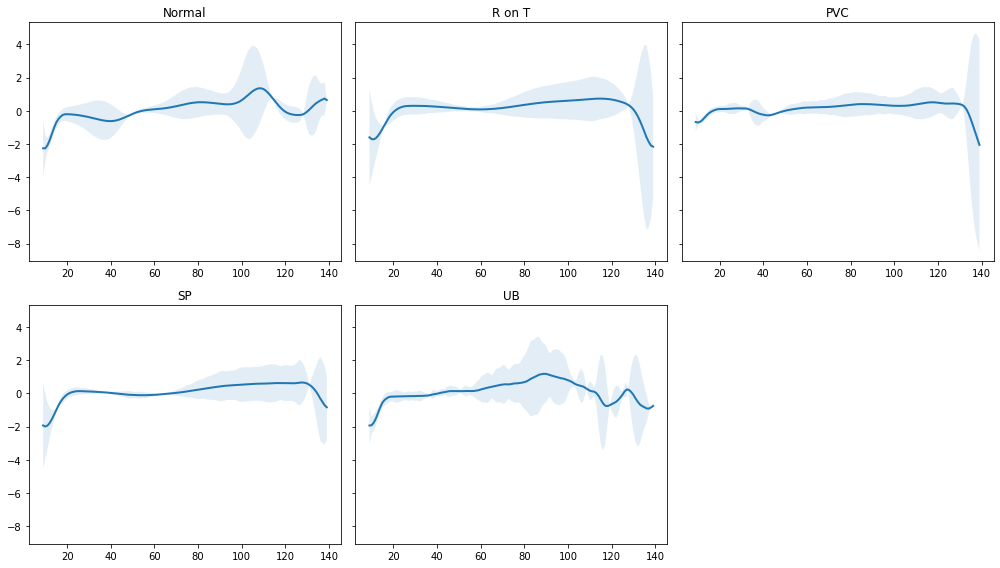

In [3]:
CLASS_NORMAL = 1
class_names = ['Normal','R on T','PVC','SP','UB']

classes = df.target.unique()
print(classes)

def plot_ECG_class(data, class_name, ax, n_steps=10):
    time_series_df = pd.DataFrame(data)

    smooth_path = time_series_df.rolling(n_steps).mean()
    path_deviation = time_series_df.rolling(2, win_type='gaussian').sum(std=1)#2 * time_series_df.rolling(n_steps).std()

    under_line = (smooth_path - path_deviation)[0]
    over_line = (smooth_path + path_deviation)[0]

    ax.plot(smooth_path, linewidth=2)
    ax.fill_between(
    path_deviation.index,
    under_line,
    over_line,
    alpha=.125
    )
    ax.set_title(class_name)
    
    
fig, axs = plt.subplots(
      nrows=len(classes) // 3 + 1,
      ncols=3,
      sharey=True,
      figsize=(14, 8)
    )

for i, cls in enumerate(classes):
    ax = axs.flat[i]
    data = df[df.target == cls] \
    .drop(labels='target', axis=1) \
    .mean(axis=0) \
    .to_numpy()# cls first argument in class method? Why?
    plot_ECG_class(data, class_names[i], ax)  #######

fig.delaxes(axs.flat[-1])
fig.tight_layout();

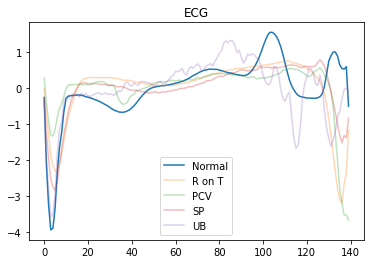

In [4]:
#print(df[df.target == "b'1'"].drop(labels='target', axis=1).mean(axis=0).to_numpy())
normal=df.query("target==b'1'").drop(labels='target', axis=1).mean(axis=0).to_numpy()
rOnT=df.query("target==b'2'").drop(labels='target', axis=1).mean(axis=0).to_numpy()
pcv=df.query("target==b'3'").drop(labels='target', axis=1).mean(axis=0).to_numpy()
sp=df.query("target==b'4'").drop(labels='target', axis=1).mean(axis=0).to_numpy()
ub=df.query("target==b'5'").drop(labels='target', axis=1).mean(axis=0).to_numpy()

plt.plot(normal,label="Normal")
plt.plot(rOnT,label="R on T",alpha=.3)
plt.plot(pcv, label="PCV",alpha=.3)
plt.plot(sp, label="SP",alpha=.3)
plt.plot(ub, label="UB",alpha=.3)
plt.legend()
plt.title("ECG")
plt.show()
     


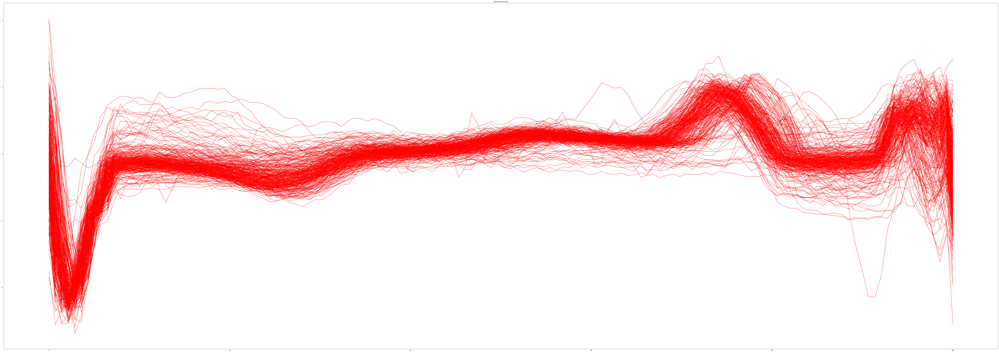

In [11]:
def PlotTheFrames(df,title,color):
    fig,ax = plt.subplots(figsize=(140,50))        
    for key,item in df.iterrows():
        array=[]
        for value in np.array(item).flatten():
            array.append(value);
        x=np.linspace(0,100,len(array))
        ax.plot(x,array,c=color)
    plt.title(title)
    plt.show()

normal=df.query("target==b'1'").drop(labels='target', axis=1)
PlotTheFrames(normal,"Normal Heart beat",'r')

    

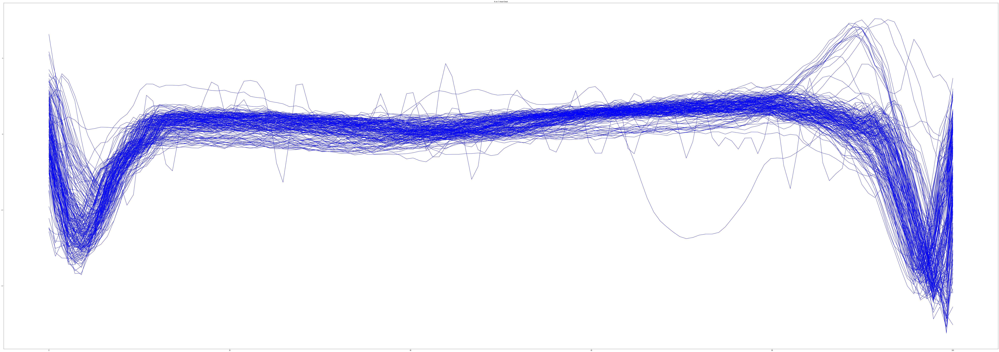

In [12]:
rOnT=df.query("target==b'2'").drop(labels='target', axis=1)

PlotTheFrames(rOnT,"R on T Heart beat","b")    


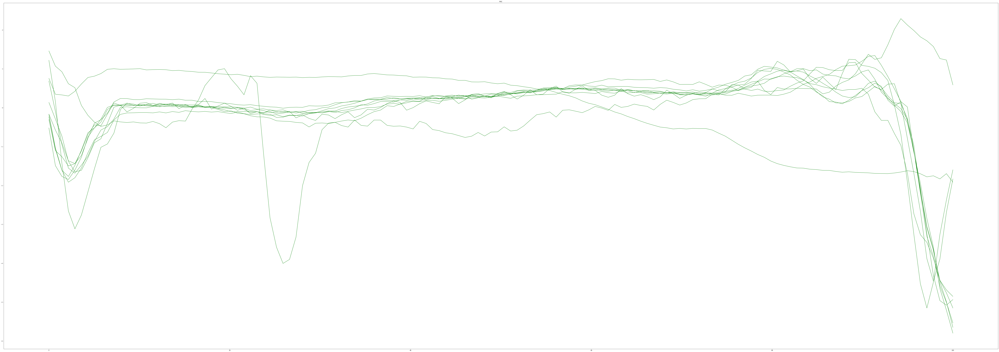

In [13]:
pvc=df.query("target==b'3'").drop(labels='target', axis=1)
PlotTheFrames(pvc,"PVC","g")    


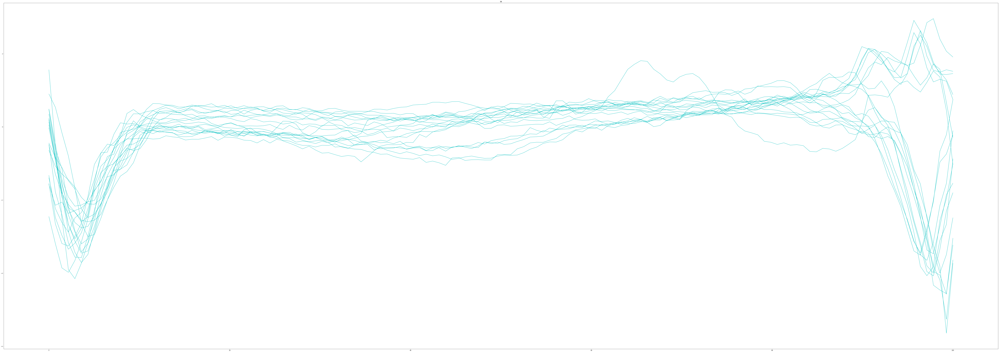

In [18]:
sb=df.query("target==b'4'").drop(labels='target', axis=1)
PlotTheFrames(sb,"SB","c") 

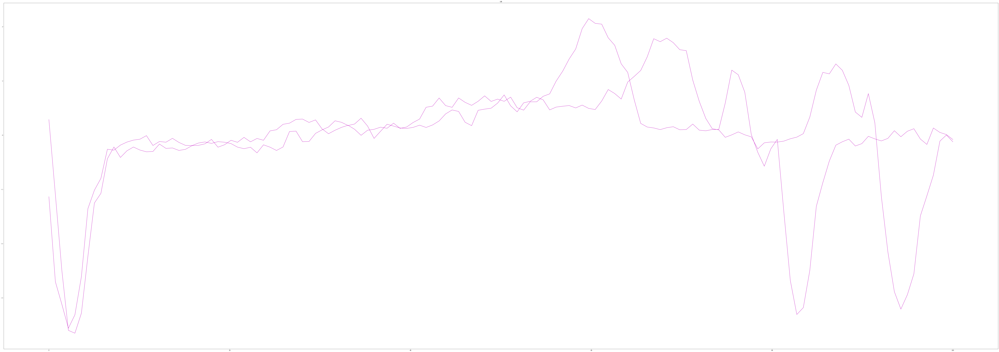

In [20]:
ub=df.query("target==b'5'").drop(labels='target', axis=1)
PlotTheFrames(ub,"UB","m") 